<a href="https://colab.research.google.com/github/daisuke-shimizu/python-Gakushuin-programming1/blob/main/Programming1_10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# サンプルプログラム実行上の注意
プログラミング上達のコツは、

- 短時間に集中してできるだけ大量のプログラムを書くこと
- 試行錯誤を行うこと
- 他人の書いた（動く）プログラムを読むこと
- 更に、自分の目的に合わせてカスタマイズしてみること

を日常的に実行することです。
しかし、限られた授業時間（予習・復習も含む）内で、これらを十分に実行することは至難です。

そこで、
この講義資料は、多数のサンプルプログラムを提供して、
少しでも不足を補うことができるように作成されています。
受講者は、以下の注意を守ってサンプルプログラムをコードセル中で実行することで、
より効率の良い学習を心がけて下さい。

1. サンプルプログラムは、コピペせず、1行1行自分でタイプして書き写して下さい。
コピペでは見逃してしまう、プログラミングの書き方の規則や、プログラミングのコツなど、
自分自身でタイプすることで気づくことができます。
2. サンプルプログラムを書き写す時は、プログラムの意味を考えるよう努めて下さい。
最初は必ずしも最良とは言えないサンプルプログラムを提示して、
後で改良した例を示すなど、この講義資料では、良いプログラムを作成する考え方を効率的に学べるよう、
いろいろな工夫をしています。
3. 意味を理解できない行がある場合には、あまり拘泥せず、先に進んでください。
100%理解しないといけないという思い込みは、プログラミングの上達にとって妨げです。
理解するための努力は必要ですが、Pythonでできることの範囲は非常に広く、
プロのプログラマでも全部は理解していないでしょう。
完璧な理解よりも、**動くプログラムを書くことを最優先の目標**として、
わからない部分は「おまじない」として受け入れることができると、上達も早くなります。
「おまじない」とは、「なぜ効くのかはわからないけれども、使い方は分かっている」という意味です。


# 前回の演習問題の解答例

演習9-1は、サンプルプログラムを実行するだけなので、解答例は省略します。

### 演習9-2
以下のように、$N$（例では100）を引数に指定すると、
$N$人の`Person`オブジェクトを格納したリストオブジェクトを返す関数`generate_samples`のプログラムを作成せよ。
```python
persons = generate_samples(100)
```

**解答例**
```python
def generate_samples(N):
    fn_pool = ['Smith', 'Johnson', 'Williams', 'Jones', 'Brown', 'Davis', 'Miller', 'Wilson', 'Moore', 'Taylor', 'Anderson', 'Thomas', 'Jackson', 'White', 'Harris', 'Martin', 'Thompson', 'Garcia', 'Martinez', 'Robiinson']
    gn_pool = ['Noah', 'Liam', 'Elijah', 'Oliver', 'James', 'Mason', 'Logan', 'Lucas', 'Mateo', 'Ethan', 'Olivia', 'Emma', 'Ava', 'Isabella', 'Mia', 'Sophia', 'Amelia', 'Charlotte', 'Luna', 'Harper']
    bt_pool = ['A', 'B', 'O', 'AB']

    fn = [random.choice(fn_pool) for _ in range(N)]
    gn = [random.choice(gn_pool) for _ in range(N)]
    bt = [random.choice(bt_pool) for _ in range(N)]
    bm = []
    bd = []
    for _ in range(N):
        if random.choice([0, 1,2,3]) == 0:
            x = random.choice(range(1, 367))
            month_len = [31, 29, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
        else:
            x = random.choice(range(1, 366))
            month_len = [31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
        m, d = month_date(x)
        bm.append(m)
        bd.append(d)
    return [Person(fn[n], gn[n], bm[n], bd[n], bt[n]) for n in range(N)]
```

### 演習 9-3
`conflict_count`の値を計算する、上記のプログラムを完成させよ。

**解答例**
```python
conflict_count = 0
for _ in range(100):
    persons = generate_samples(N)
    birthdays = [p.birthday() for p in persons]
    count = {}
    for date in birthdays:
        if date in count:
            count[date] += 1
        else:
            count[date] = 1
    if hasConflict(count) == True:
        conflict_count += 1
```

### 演習 9-4
ステップ３のプログラムを完成せよ。

**解答例**
```python
prob = []
for N in range(2, 101):
    conflict_count = 0
    for _ in range(100):
        persons = generate_samples(N)
        birthdays = [p.birthday() for p in persons]
        count = {}
        for date in birthdays:
            if date in count:
                count[date] += 1
            else:
                count[date] = 1
        if hasConflict(count) == True:
            conflict_count += 1
    prob.append(conflict_count/100)
```

### 演習 9-5
$y = f(x)$のグラフを`plt.plot()`関数を使って、折れ線グラフで描き、$f(x) = 0.5$となる$x$の値を調べよ。
これが誕生日のパラドックスの答えである。

**解答例**
```python
import matplotlib.pyplot as plt
plt.grid()
plt.plot(range(2,101), prob)
```

# 第10回　動かすグラフ
この回は、ちょっと息抜きをして、plotlyとnumpyという新しいライブラリを使って、動かせる３次元グラフを書いてみます。

今まで、グラフを描くためライブラリとして、matplotlib.pyplotを使ってきましたが、pyplotはPythonでグラフを書くための唯一のライブラリではありません。
伝統的なプログラミング言語、例えば、Cでは、標準化団体によって言語仕様が標準化されています。
例えば、「標準C」と呼ばれる言語仕様は、日本のJIS（日本規格協会）にあたる、
米国のANSI（American National Standards Institution）において標準化され、
その後、ISO（International Organization of Standardization）により国際標準になったことから、
「ANSI C」、「ISO C」と呼ばれています。
同様に、Cのライブラリも標準化され、
プログラムの移植性（異なる環境においても動作が保証される）が重視されています。

一方、Pythonを含む近年の新世代のプログラミング言語では、
ユーザが自由にライブラリを開発し、他のユーザに提供する環境を意図的に提供します。
自然淘汰の原理に基づいて、より良いライブラリの実装をユーザに提供するとともに、
時代の進歩に追従して新しい機能をタイムリーに提供することを目指します。
Pythonは、この傾向が現代の他のプログラミング言語に比較しても顕著であり、以前にも述べましたが、
言語仕様は最小限にとどめて、少しでも高度な機能はライブラリで実現しようという思想に基づいています。
この思想は徹底しており、平方根や三角関数のような基本的な関数ですら、
ライブラリから利用しなければなりません。

さて、この回ではPlotlyというライブラリを紹介しますが、
実は、Pyplotを使っても三次元のグラフなどを描くことはできます。

例えば、方程式

$$ z = x^2 + y^2 $$

で定まる$x$-$y$-$z$空間内の曲面を以下のプログラムで描画します。
```python
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
x = np.arange(-1, 1, 0.1)
y = np.arange(-1, 1, 0.1)
X, Y = np.meshgrid(x, y)
Z = X**2 + Y**2
fig = plt.figure()
ax = Axes3D(fig)
ax.plot_wireframe(X, Y, Z)
plt.show()
```

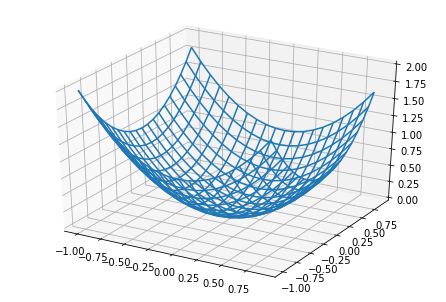

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

x = np.arange(-1, 1, 0.1)
y = np.arange(-1, 1, 0.1)
X, Y = np.meshgrid(x, y)
Z = X**2 + Y**2
fig = plt.figure()
ax = Axes3D(fig)
ax.plot_wireframe(X, Y, Z)
plt.show()

このグラフにおける立体の描画方法は、ワイヤフレームですが、十分感じが掴めると思います。

シンプルな曲面なら、これでも良いのですが、
起伏の激しい曲面を描くと、見にくくなっていきます。
例えば、方程式

$$ z = \sin(\pi x) \cdot \cos(\pi y) $$

が定める曲面は下のように描画されます。
三角関数を高校で習っていない方もいると思いますが、
ここでは、三角関数の定義や性質を理解している必要はありませんので、
単なるブラックボックス関数として、
`np.sin()`、`np.cos()`という名前で呼び出す関数とだけ考えてください。

```python
import numpy as np
import matplotlib.pyplot as plt
import math
from mpl_toolkits.mplot3d import Axes3D
x = np.arange(-2, 2, 0.1)
y = np.arange(-2, 2, 0.1)
X, Y = np.meshgrid(x, y)
Z = np.sin(math.pi * X) * np.cos(math.pi * Y)
fig = plt.figure()
ax = Axes3D(fig)
ax.plot_wireframe(X, Y, Z)
plt.show()
```

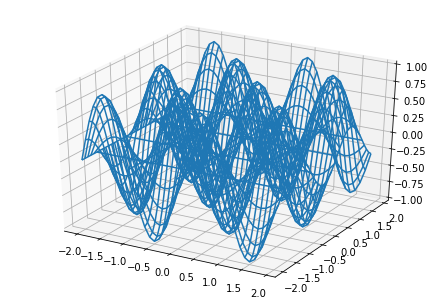

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import math
from mpl_toolkits.mplot3d import Axes3D
x = np.arange(-2, 2, 0.1)
y = np.arange(-2, 2, 0.1)
X, Y = np.meshgrid(x, y)
Z = np.sin(math.pi * X) * np.cos(math.pi * Y)
fig = plt.figure()
ax = Axes3D(fig)
ax.plot_wireframe(X, Y, Z)
plt.show()

グラフは山が整然と並んだ曲面になるのですが、重なりが大きく、分かりにくいと思います。

参考に、次のプログラムで、三角関数の定義を図で示しますが、定義そのものは理解しなくても構いません。
pyplotで図も描けるという例だと思ってもらえれば結構です。
- `plt.axis('off')`で、軸や目盛り、グラフの枠を消しています。
- `plt.text(0.9, 0.25, "sin θ")`で、座標$(0.9, 0.25)$の位置にテキスト$\sin\theta$を表示しています。

```python
tRange = np.arange(0, math.pi/6, 0.01)
plt.plot([0, np.sqrt(3)/2, np.sqrt(3)/2, 0], [0, 1/2, 0, 0])
plt.plot([0.2 * np.cos(t) for t in tRange], [0.2 * np.sin(t) for t in tRange])
plt.text(0.9, 0.25, "sin θ", fontsize=20)
plt.text(0.4, 0.3, "1", fontsize=20)
plt.text(0.4, 0.02, "cos θ", fontsize=20)
plt.text(0.2, 0.05, 'θ', fontsize=20)
plt.axis('off')
```

(-0.04330127018922193, 0.9093266739736605, -0.025, 0.525)

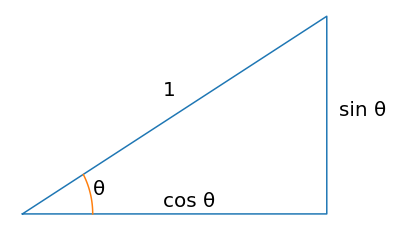

In [3]:
tRange = np.arange(0, math.pi/6, 0.01)
plt.plot([0, np.sqrt(3)/2, np.sqrt(3)/2, 0], [0, 1/2, 0, 0])
plt.plot([0.2 * np.cos(t) for t in tRange], [0.2 * np.sin(t) for t in tRange])
plt.text(0.9, 0.25, "sin θ", fontsize=20)
plt.text(0.4, 0.3, "1", fontsize=20)
plt.text(0.4, 0.02, "cos θ", fontsize=20)
plt.text(0.2, 0.05, 'θ', fontsize=20)
plt.axis('off')


この図が示すように、角度$\theta$を持ち、斜辺の長さが１の直角三角形に対して、
角$\theta$の腕となる辺の長さを$\cos\theta$、角$\theta$と向かい合う辺の長さを$\sin\theta$と定義します。
$\cos\theta$を正弦関数、$\sin\theta$を余弦関数と呼ぶこともあります。
これだけです。
難しく無いでしょ？

あとは、グラフの形を覚えておくと良いでしょう。
pyplotとmathを使って簡単に正弦関数・余弦関数のグラフを書いて見ます。

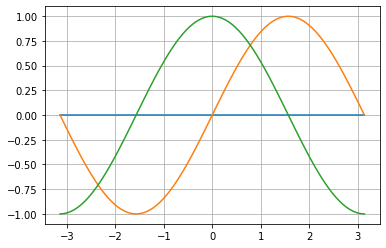

In [9]:
import matplotlib.pyplot as plt
import math
import numpy as np

x = np.linspace(-math.pi, math.pi, 100)

y0 = [0*o for o in x]
y1 = [math.sin(p) for p in x]
y2 = [math.cos(q) for q in x]

plt.plot(x, y0)
plt.plot(x, y1)
plt.plot(x, y2)
plt.grid(True)

plt.show()

角度の単位には、「度」（ディグリー）ではなくラジアンを使います。
長さを測る時に、メートル法を使うか、ヤード法を使うかの違いと同じで、本質的な違いはありません。
ただし、ラジアンには、以下に述べる、顕著なメリットがあり、数学では広く使われていることから、
プログラミング言語でも、角関数の単位にラジアンが使われることが一般的です。

度は、円の一周を360度とする角度の単位です。
古代バビロニアの60進法に由来するとか、
天文学において1年を360日と考えたことから決められた単位であると考えられており、
また、約数が多いことから（$360 = 2^3\times 3^2 \times 5$）、
円弧を表現する時に中心角を整数で表現できることが多いという利点があるとされます。
逆に言えば、
角度の単位に度を使うことには、ここで述べた以上の合理的なメリットがあるわけではありません。
皆さんが、度を自然に思えて、ラジアンを奇異に感じるとしたら、
それは最初に習った角度の単位が度であった以上の理由はありません。

一方、ラジアンは、角度の別の単位であり、半径1・中心角$\theta$の円弧の長さで、$\theta$を表します。
従って、半径1の円周は$2\pi$ですので、360度はラジアンでは$2\pi$となり、
180度は$\pi$、90度は$\frac\pi2$、60度は$\frac\pi3$、45度は$\frac\pi4$、
30度は$\frac\pi6$と表されます。
ラジアンを使えば、半径$r$、中心角$\theta$の円弧の長さは、$r\theta$と簡潔に表すことができますが、
$\theta$の単位に度を使うと、
同じ円弧の長さが$\frac{r\pi\theta}{180}$と表現されます。
具体的には述べませんが、三角関数の微分もラジアンを単位に用いると係数が1となるなど、
色々な数学的表現が簡素になるというメリットがラジアンにはあります。

さて、`plt.plot(x, cos, label="cos x")`において、
グラフの曲線（データ系列）に`label`を付与し、
`plt.legend()`で、**凡例**をつけています。
グラフの左上に、「青の曲線は$\cos x$、オレンジの曲線は$\sin x$を表す」ことを示す表記がありますが、
これを凡例とよび、曲線には`label=`で名前をつけているのです。

閑話休題、
同じ曲面$z = \sin \pi x \cdot \cos \pi y$を、plotlyという新しいグラフ描画用のライブラリを使います。

```python
import numpy as np
import plotly.graph_objects as go
x = np.arange(-2, 2, 0.01)
y = np.arange(-2, 2, 0.01)
X, Y = np.meshgrid(x, y)
Z = np.sin(math.pi * X) * np.cos(math.pi * Y)
data = [go.Surface(x=X, y=Y, z=Z)]
fig = go.Figure(data)
fig.show()
```

In [10]:
import numpy as np
import plotly.graph_objects as go
x = np.arange(-2, 2, 0.01)
y = np.arange(-2, 2, 0.01)
X, Y = np.meshgrid(x, y)
Z = np.sin(math.pi * X) * np.cos(math.pi * Y)
data = [go.Surface(x=X, y=Y, z=Z)]
fig = go.Figure(data)
fig.show()

グラフを左クリックしながらドラッグすることで、グラフを見る角度を変えることができます。
グラフの大きさは右クリックしながらドラッグすることで変更できます。
異なる角度から曲面を眺めることにより、曲面の形がよく分かるのでは無いかと思います。

この節では、plotlyに使って、このような三次元グラフ描画のプログラムを書けるようになることを目的とします。
けれども、プログラムの全ての行を理解し、全ての行を自力でゼロから書けるようになる必要もありません。
わからない部分があっても、既存のプログラムを改良して、
自分が求めるグラフが描画できるようになればそれで十分です。

ですが、簡単に、plotlyでグラフを描画する時の方法を概説しておきます。

- グラフ描画のためのライブラリは`plotly.graph_objects`です。
ライブラリ名が長いので、略称`go`が使えるように`import`します。
- 2次元のグラフは`go.グラフの種別(x=x座標の配列, y=y座標の配列)`、
3次元のグラフは`go.グラフの種別(x=x座標の配列, y=y座標の配列, z=z座標の配列)`で指定します。
- グラフのリスト`data = [グラフ1, グラフ2, ...]`を生成します。
リストには同時に描画したいグラフを全て指定しますが、一つのグラフのみを描画したい場合でもリストに指定します。
- `fig = go.Figure(data)`とし、`fig.show()`で表示します。


## 空間に点と線を描こう
空間に点をプロットすることから、始めましょう。
```python
import plotly.graph_objects as go
x = [0]
y = [0]
z = [0]
data = [go.Scatter3d(x=x, y=y, z=z, mode='markers')]
fig = go.Figure(data)
fig.show()
```

In [11]:
import plotly.graph_objects as go
x = [0]
y = [0]
z = [0]
data = [go.Scatter3d(x=x, y=y, z=z, mode = 'markers')]
fig = go.Figure(data)
fig.show()

原点$(0, 0, 0)$に大きな円がプロットされていることを、いろいろな方向からグラフを見て、確認してください。

`go.Scatter3d`が、3次元に点・直線・曲線を描画するための一般的な関数名です。

次のプログラムは2点$(0, 0, 0), (1, 1, 1)$をプロットします。
```python
import plotly.graph_objects as go
x = [0, 1]
y = [0, 1]
z = [0, 1]
data = [go.Scatter3d(x=x, y=y, z=z, mode='markers')]
fig = go.Figure(data)
fig.show()
```

In [12]:
import plotly.graph_objects as go
x = [0, 1]
y = [0, 1]
z = [0, 1]
data = [go.Scatter3d(x=x, y=y, z=z, mode='markers')]
fig = go.Figure(data)
fig.show()

最初は1点しか表示されていないように見えるかもしれませんが、
グラフを回転させて、違った角度から見ると、確かに2点表示されていることがわかると思います。

### 演習10-1
8点$(0,0,0),(1,0,0),(0,1,0),(1,1,0),(0,0,1),(1,0,1),(0,1,1),(1,1,1)$を頂点とする一辺の長さが１の立方体の頂点を描画せよ。

In [13]:
# 演習10-1の解答
import plotly.graph_objects as go
x = [0, 1, 0, 1, 0, 1, 0, 1]
y = [0, 0, 1, 1, 0, 0, 1, 1]
z = [0, 0, 0, 0, 1, 1, 1, 1]
data = [go.Scatter3d(x=x, y=y, z=z, mode='markers')]
fig = go.Figure(data)
fig.show()

今度は、直線を書いてみましょう。
```python
import plotly.graph_objects as go
x = [0, 1]
y = [0, 1]
z = [0, 1]
data = [go.Scatter3d(x=x, y=y, z=z, mode='lines')]
fig = go.Figure(data)
fig.show()
```

In [14]:
import plotly.graph_objects as go
x = [0, 1]
y = [0, 1]
z = [0, 1]
data = [go.Scatter3d(x=x, y=y, z=z, mode='lines')]
fig = go.Figure(data)
fig.show()

一瞬、何も描画されていないように思ったかも知れませんが、
グラフを回転させると、点$(0,0,0)$と点$(1,1,1)$線分が描かれていることが確認できます。
- `mode='markers'`とすると点がマーカーにより描画されます。
- `mode='lines'`とすると点を結ぶ直線が描画されます。

次のプログラムを実行する前に、結果を想像してください。
```python
import plotly.graph_objects as go
x = [0, 0, 1, 1]
y = [0, 1, 1, 0]
z = [0, 0, 0, 0]
data = [go.Scatter3d(x=x, y=y, z=z, mode='lines')]
fig = go.Figure(data)
fig.show()
```

In [15]:
import plotly.graph_objects as go
x = [0, 0, 1, 1]
y = [0, 1, 1, 0]
z = [0, 0, 0, 0]
data = [go.Scatter3d(x=x, y=y, z=z, mode='lines')]
fig = go.Figure(data)
fig.show()

どうでしょうか？
想定通りでしたか？

点は4点描画されましたが、線分は4点を描画の順番に結ぶ3辺が描画されます。

### 演習10-2
上のセルのプログラムを修正して、4辺を描画して、正方形が表示されるようにせよ。

In [17]:
# 演習10-2の解答
import plotly.graph_objects as go
x = [0, 0, 1, 1, 0]
y = [0, 1, 1, 0, 0]
z = [0, 0, 0, 0, 0]
data = [go.Scatter3d(x=x, y=y, z=z, mode='lines')]
fig = go.Figure(data)
fig.show()

リスト`data`に複数のグラフを指定することで、複数のグラフを描画することが可能となります。

次のプログラムを実行してみましょう。
```python
import plotly.graph_objects as go
x = [0, 0, 1, 1, 0]
y = [0, 1, 1, 0, 0]
z = [0, 0, 0, 0, 0]
trace1 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
x = [0, 0, 1, 1, 0]
y = [0, 0, 0, 0, 0]
z = [0, 1, 1, 0, 0]
trace2 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
data = [trace1, trace2]
fig = go.Figure(data)
fig.show()
```

In [18]:
import plotly.graph_objects as go
x = [0, 0, 1, 1, 0]
y = [0, 1, 1, 0, 0]
z = [0, 0, 0, 0, 0]
trace1 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
x = [0, 0, 1, 1, 0]
y = [0, 0, 0, 0, 0]
z = [0, 1, 1, 0, 0]
trace2 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
data = [trace1, trace2]
fig = go.Figure(data)
fig.show()

### 演習10-3
上のセルのプログラムを修正して、一辺の長さ１の立方体を描画せよ。

In [19]:
# 演習10-3の解答
import plotly.graph_objects as go
x = [0, 0, 1, 1, 0]
y = [0, 1, 1, 0, 0]
z = [0, 0, 0, 0, 0]
trace1 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
x = [0, 0, 1, 1, 0]
y = [0, 0, 0, 0, 0]
z = [0, 1, 1, 0, 0]
trace2 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
x = [0, 0, 1, 1, 0]
y = [1, 1, 1, 1, 1]
z = [0, 1, 1, 0, 0]
trace3 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
x = [0, 0, 1, 1, 0]
y = [1, 0, 0, 1, 1]
z = [1, 1, 1, 1, 1]
trace4 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
data = [trace1, trace2, trace3, trace4]
fig = go.Figure(data)
fig.show()

下のセルのプログラムは、一辺の長さが１の正四面体を2個連結した立体を、「一筆書き」で描画します。
正四面体は、各面が正三角形で、４つの面を持つ立体です。
グラフをいろいろな方向から眺めながら、このことを確かめてください。

ちなみに、立方体は正六面体とも呼ばれ、各面が正方形で、６つの面を持つ立体のことになります。
```python
import plotly.graph_objects as go
import math
x = [0.5, 0, 0.5, 1, 0.5, 0.5, 0, 1, 0.5, 0.5]
y = [math.sqrt(3)/6, 0, math.sqrt(3)/6, 0, math.sqrt(3)/6, math.sqrt(3)/2, 0, 0, math.sqrt(3)/2, math.sqrt(3)/6]
z = [math.sqrt(2/3), 0, -math.sqrt(2/3), 0, math.sqrt(2/3), 0, 0, 0, 0, -math.sqrt(2/3)]
data = [go.Scatter3d(x=x, y=y, z=z, mode="lines")]
fig = go.Figure(data = data)
fig.show()
```


In [20]:
import plotly.graph_objects as go
import math
x = [0.5, 0, 0.5, 1, 0.5, 0.5, 0, 1, 0.5, 0.5]
y = [math.sqrt(3)/6, 0, math.sqrt(3)/6, 0, math.sqrt(3)/6, math.sqrt(3)/2, 0, 0, math.sqrt(3)/2, math.sqrt(3)/6]
z = [math.sqrt(2/3), 0, -math.sqrt(2/3), 0, math.sqrt(2/3), 0, 0, 0, 0, -math.sqrt(2/3)]
data = [go.Scatter3d(x=x, y=y, z=z, mode="lines")]
fig = go.Figure(data = data)
fig.show()

### 演習10-4
上のセルのプログラムで描画される正四面体の６個の頂点の座標を求めよ。
解答は提出しなくて良い。


## 空間曲線を描こう

一般に、空間曲線は、パラメータ$t$と関数$f, g, h$に対して、$x = f(t), y = g(t), z = h(t)$で与えられます。
例えば、ボールを投げた時、ボールの軌跡は放物線を描きますが、時刻$t$における座標は、定数$a, b, c, d$に対して、
$$
x = at, \quad y = bt, \quad z = ct - dt^2
$$
と表されます。
何通りかの$a, b, c, d$に対して、ボールの軌跡を描画してみましょう。
```python
import plotly.graph_objects as go
import numpy as np
# 
t = np.linspace(0, 10, 11)
x = t
y = t/2
z = t - t**2/10
trace1 = go.Scatter3d(x=x, y=y, z=z, mode='markers')
x = t/2
y = t
z = 2*t - t**2/5
trace2 = go.Scatter3d(x=x, y=y, z=z, mode='markers')
x = 0*t
y = 2*t/3
z = 3*t - 3*t**2/10
trace3 = go.Scatter3d(x=x, y=y, z=z, mode='markers')
data = [trace1, trace2, trace3]
fig = go.Figure(data)
fig.show()
```

In [22]:
import plotly.graph_objects as go
import numpy as np
t = np.linspace(0, 10, 11)
x = t
y = t/2
z = t - t**2/10
trace1 = go.Scatter3d(x=x, y=y, z=z, mode='markers')
x = t/2
y = t
z = 2*t - t**2/5
trace2 = go.Scatter3d(x=x, y=y, z=z, mode='markers')
x = 0*t
y = 2*t/3
z = 3*t - 3*t**2/10
trace3 = go.Scatter3d(x=x, y=y, z=z, mode='markers')
data = [trace1, trace2, trace3]
fig = go.Figure(data)
fig.show()

上のセルの放物線を描くプログラムで、点による描画を、曲線に変えてみます。
`go.Scatter3d()`の`mode='markers'`を`mode='lines'`に変更します。
```python
import plotly.graph_objects as go
import numpy as np
# 
t = np.linspace(0, 10, 11)
x = t
y = t/2
z = t - t**2/10
trace1 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
x = t/2
y = t
z = 2*t - t**2/5
trace2 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
x = 0*t
y = 2*t/3
z = 3*t - 3*t**2/10
trace3 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
data = [trace1, trace2, trace3]
fig = go.Figure(data)
fig.show()
```

In [23]:
import plotly.graph_objects as go
import numpy as np
t = np.linspace(0, 10, 11)
x = t
y = t/2
z = t - t**2/10
trace1 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
x = t/2
y = t
z = 2*t - t**2/5
trace2 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
x = 0*t
y = 2*t/3
z = 3*t - 3*t**2/10
trace3 = go.Scatter3d(x=x, y=y, z=z, mode='lines')
data = [trace1, trace2, trace3]
fig = go.Figure(data)
fig.show()

上のプログラムの`mode='lines'`を`mod='lines+markers`に変更して、
グラフを描画してみましょう。

In [24]:
import plotly.graph_objects as go
import numpy as np
t = np.linspace(0, 10, 11)
x = t
y = t/2
z = t - t**2/10
trace1 = go.Scatter3d(x=x, y=y, z=z, mode='lines+markers')
x = t/2
y = t
z = 2*t - t**2/5
trace2 = go.Scatter3d(x=x, y=y, z=z, mode='lines+markers')
x = 0*t
y = 2*t/3
z = 3*t - 3*t**2/10
trace3 = go.Scatter3d(x=x, y=y, z=z, mode='lines+markers')
data = [trace1, trace2, trace3]
fig = go.Figure(data)
fig.show()

上のプログラムでは、numpyというライブラリを使いました。
numpy は最もよく使われるライブラリで、数値計算を高速で実行する他、色々と便利な機能を提供します。
例えば、プログラム中の
```python
t = np.linspace(0, 10, 11)
```
は、0から始まり10で終わる区間に等間隔に11個の点（数）をとります。
次のコードを実行してみてください。
```python
import numpy as np
t = np.linspace(0, 10, 11)
print(t)
```

In [25]:
import numpy as np
t = np.linspace(0, 10, 11)
print(t)

[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


これは`range(0, 11)`と同じ働きをします。

numpyでは`arange`という関数も用意しています。
```python
t = np.arange(0, 11, 1)
```
は、0以上1１未満区間に、0から始まり間隔１で点（数）をとります。
１１個の点をとるため、これも`t = np.linspace(0, 10, 11)`と同じ働きをします。
```python
t = np.arange(0, 11, 1)
print(t)
```

In [26]:
t = np.arange(0, 11, 1)
print(t)

[ 0  1  2  3  4  5  6  7  8  9 10]


`np.linspace(0, 10, 11)`と`np.arange(0, 11, 1)`とは、リスト`[0,1,2,3,4,5,6,7,8,9,10]`と同じに見えますが、実はnumpy.arrayという違うクラスのオブジェクトです。
例えば、
```python
print(np.linspace(0, 10, 11) * 2)
```
とすると、何が出力されると思いますか？
次のセルを実行してみてください。
```python
print(np.linspace(0, 10, 11) * 2)
```

In [27]:
print(np.linspace(0, 10, 11) * 2)

[ 0.  2.  4.  6.  8. 10. 12. 14. 16. 18. 20.]


想像通りでしたか？

これはとても便利な機能です。
実際、上の放物線を描くプログラムで、
```python
t = np.linspace(0, 10, 11)
x = t
y = t/2
z = t - t**2/10
```
としています。
`t`は１１個の要素からなるnumpy.arrayですが、`y = t/2`も`z = t - t**2/10`も共に１１個の要素からなるnumpy.arrayになります。
実際、`t, x, y, z`の最初の要素は、それぞれ、

$$ t=0, x=0, y=\frac 02, z=0 - \frac{0^2}{10} $$

となり、2番目の要素は、

$$ t=1, x=1, y=\frac 12, z=1 - \frac{1^2}{10} = \frac 9{10} $$

３番目の要素は、

$$ t=2, x=2, y=\frac 22=1, z = 2 - \frac{2^2}{10} = \frac 85$$

となります。
実際、次のコードを実行してみてください。
```python
import numpy as np
t = np.linspace(0, 10, 11)
x = t
y = t/2
z = t - t**2/10
print(t)
print(x)
print(y)
print(z)
```

In [28]:
import numpy as np
t = np.linspace(0, 10, 11)
x = t
y = t/2
z = t - t**2/10
print(t)
print(x)
print(y)
print(z)

[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]
[0.  0.5 1.  1.5 2.  2.5 3.  3.5 4.  4.5 5. ]
[0.  0.9 1.6 2.1 2.4 2.5 2.4 2.1 1.6 0.9 0. ]


さて、次は、螺旋を書いてみましょう。
まず、$xy$-平面内に、円を描いてみます。
```python
import numpy as np
import plotly.graph_objects as go
t = np.arange(0, 20, 0.2)
x = np.cos(t)
y = np.sin(t)
z = 0 * t
data = [go.Scatter3d(x=x, y=y, z=z, mode='markers')]
fig = go.Figure(data)
fig.show()
print("t = ", t)
```

In [29]:
import numpy as np
import plotly.graph_objects as go
t = np.arange(0, 20, 0.2)
x = np.cos(t)
y = np.sin(t)
z = 0 * t
data = [go.Scatter3d(x=x, y=y, z=z, mode='markers')]
fig = go.Figure(data)
fig.show()
print("t = ", t)

t =  [ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8  2.   2.2  2.4  2.6
  2.8  3.   3.2  3.4  3.6  3.8  4.   4.2  4.4  4.6  4.8  5.   5.2  5.4
  5.6  5.8  6.   6.2  6.4  6.6  6.8  7.   7.2  7.4  7.6  7.8  8.   8.2
  8.4  8.6  8.8  9.   9.2  9.4  9.6  9.8 10.  10.2 10.4 10.6 10.8 11.
 11.2 11.4 11.6 11.8 12.  12.2 12.4 12.6 12.8 13.  13.2 13.4 13.6 13.8
 14.  14.2 14.4 14.6 14.8 15.  15.2 15.4 15.6 15.8 16.  16.2 16.4 16.6
 16.8 17.  17.2 17.4 17.6 17.8 18.  18.2 18.4 18.6 18.8 19.  19.2 19.4
 19.6 19.8]


上のセルで示したように、`t`は、0から19.8まで、0.2刻みで100個の数が指定されたnumpy.arrayのオブジェクトです。

一方、`z = 0 * t`により、`t`の100個の要素それぞれに0が乗じられて`z`が定義されていますので、
`z`は、0が100個並ぶnumpy.arrayのオブジェクトになります。
`z`は、100個の点の$z$座標を与えていますので、$xy$-平面状に100個の点がプロットされることになります。

ここは、
```python
x = np.cos(t)
y = np.sin(t)
```
の記述に注目してください。
繰り返しになりますが、`t`は`[0. 0.2 0.4 0.6 ... 19.8]`の100個の数を要素に持つnumpy.arrayです。
普通、三角関数の引数は数である筈ですが、
numpyではnumpy.arrayを引数に取ること、つまり、複数の数を引数にとることを許します。
`x = numpy.cos(t)`は、
$[\cos(0)\ \cos(0.2)\ \cos(0.4)\ \cos(0.6)\ \dots\ \cos(19.8)]$を要素として持つ
numpy.arrayになります。
`numpy.cos()`を含めて、numpyライブラリで用意される関数の多くは、
引数に`numpy.array`のオブジェクトが来ると、要素ごとに関数を実行して、
計算した値を`numpy.array`にまとめる機能を持っています。

正弦関数`cos()`は、`math`ライブラリにも用意されていますが、
複数の値を計算する機能は、`math`ライブラリには用意されていません。
例えば、
```python
import numpy as np
import math
t = np.linspace(0, 20, 0.2)
x = math.cos(t)
```
はエラーになります。

次のセルのプログラムでは、$z$座標を`z = t`によって変化させるので、螺旋状に点をプロットできることになります。
```python
import numpy as np
import plotly.graph_objects as go
t = np.arange(0, 20, 0.2)
x = np.cos(t)
y = np.sin(t)
z = t
data = [go.Scatter3d(x=x, y=y, z=z, mode='markers')]
fig = go.Figure(data)
fig.show()
```

In [30]:
import numpy as np
import plotly.graph_objects as go
t = np.arange(0, 20, 0.2)
x = np.cos(t)
y = np.sin(t)
z = t
data = [go.Scatter3d(x=x, y=y, z=z, mode='markers')]
fig = go.Figure(data)
fig.show()

`mode='markers'`を`mode='lines'`に変えると、点の列ではなく、曲線を得ることができます。

In [31]:
import numpy as np
import plotly.graph_objects as go
t = np.arange(0, 20, 0.2)
x = np.cos(t)
y = np.sin(t)
z = t
data = [go.Scatter3d(x=x, y=y, z=z, mode='lines')]
fig = go.Figure(data)
fig.show()

次のプログラムでは、
```python
x = t * np.cos(t)
y = t * np.sin(t)
```
の部分が、前のセルのプログラムと異なります。

どのような曲線が描かれると思いますか？
想像してから、プログラムを実行してください。
```python
import numpy as np
import plotly.graph_objects as go
t = np.arange(0, 20, 0.2)
x = t * np.cos(t)
y = t * np.sin(t)
z = t
data = [go.Scatter3d(x=x, y=y, z=z, mode='markers')]
fig = go.Figure(data)
fig.show()
```

In [32]:
import numpy as np
import plotly.graph_objects as go
t = np.arange(0, 20, 0.2)
x = t * np.cos(t)
y = t * np.sin(t)
z = t
data = [go.Scatter3d(x=x, y=y, z=z, mode='markers')]
fig = go.Figure(data)
fig.show()

想像はあたりましたか？
じょうごの中を転がり落ちていくボールの軌跡に見えますね。

前と同じように、`mode='markers'`を`mode='lines'`に変えてみましょう。

In [33]:
import numpy as np
import plotly.graph_objects as go
t = np.arange(0, 20, 0.2)
x = t * np.cos(t)
y = t * np.sin(t)
z = t
data = [go.Scatter3d(x=x, y=y, z=z, mode='lines')]
fig = go.Figure(data)
fig.show()

### 演習10-5
前のセルのプログラムでは、$z$軸方向で下にいくほど、半径が小さくなる螺旋曲線であったが、
逆に、上に行くほど半径が小さくなる螺旋曲線を描きたい。
前のセルのプログラムを修正して、そのような螺旋を描くプログラムを作成せよ。

In [42]:
# 演習10-5の解答
import numpy as np
import plotly.graph_objects as go
t = np.arange(0, 20, 0.2)
x = (20 -t) * np.cos(t)
y = (20 -t) * np.sin(t)
z = t
print(z)
data = [go.Scatter3d(x=x, y=y, z=z, mode='markers')]
fig = go.Figure(data)
fig.show()

[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8  2.   2.2  2.4  2.6
  2.8  3.   3.2  3.4  3.6  3.8  4.   4.2  4.4  4.6  4.8  5.   5.2  5.4
  5.6  5.8  6.   6.2  6.4  6.6  6.8  7.   7.2  7.4  7.6  7.8  8.   8.2
  8.4  8.6  8.8  9.   9.2  9.4  9.6  9.8 10.  10.2 10.4 10.6 10.8 11.
 11.2 11.4 11.6 11.8 12.  12.2 12.4 12.6 12.8 13.  13.2 13.4 13.6 13.8
 14.  14.2 14.4 14.6 14.8 15.  15.2 15.4 15.6 15.8 16.  16.2 16.4 16.6
 16.8 17.  17.2 17.4 17.6 17.8 18.  18.2 18.4 18.6 18.8 19.  19.2 19.4
 19.6 19.8]


### ブラウン運動（ランダムウォーク）
曲線の描画の最後に、ブラウン運動のシミュレーションを行います。
**ブラウン運動**は、例えば、水中にある花粉などが、運動する水分子と衝突することで、ランダムな動きをするものです。
1827年にロバート・ブラウンにより発見され、アインシュタインによってその原理が明らかとなり、
原子や分子の存在証明につながりました。

ここでは、ある時刻$t$に位置$(x, y, z)$に存在する粒子が、
次の時刻$t + \Delta t$には、確率$\frac 1{27}$で、$(x + \{-0.1, 0, 0.1\}, y + \{-0.1, 0, 0.1\}, z + \{-0.1, 0, 0.1\})$の$3\times 3\times 3 = 27$個の点のいずれかに
存在すると仮定します。
そして、この単純化された仮定に基づいて、時間の経過による粒子の運動をシミュレーションします。
**ランダムウォーク**ともいいます。

次のプログラムを実行してみてください。
興味深い軌跡が観察できると思います。
```python
import random
step = 0.1
x = [0]
y = [0]
z = [0]
for _ in range(10000):
  x.append(x[-1] + random.choice([0, 1, -1]) * step)
  y.append(y[-1] + random.choice([0, 1, -1]) * step)
  z.append(z[-1] + random.choice([0, 1, -1]) * step)
data = [go.Scatter3d(x=x, y=y, z=z, mode='lines')]
fig = go.Figure(data=data)
fig.show()
```

In [44]:
import random
step = 0.1
x = [0]
y = [0]
z = [0]
for _ in range(10000):
  x.append(x[-1] + random.choice([0, 1, -1]) * step)
  y.append(y[-1] + random.choice([0, 1, -1]) * step)
  z.append(z[-1] + random.choice([0, 1, -1]) * step)
data = [go.Scatter3d(x=x, y=y, z=z, mode='lines')]
fig = go.Figure(data=data)
fig.show()

## 曲面を描く

次のプログラムを実行してください。
```python
import plotly.graph_objects as go
import numpy as np
x = np.arange(-1, 1, 0.1)
y = np.arange(-1, 1, 0.1)
X, Y = np.meshgrid(x, y)
Z = X**2 + Y**2
data =[go.Surface(x=X, y=Y, z=Z)]
fig = go.Figure(data)
fig.show()
```

In [45]:
import plotly.graph_objects as go
import numpy as np
x = np.arange(-1, 1, 0.1)
y = np.arange(-1, 1, 0.1)
X, Y = np.meshgrid(x, y)
Z = X**2 + Y**2
data =[go.Surface(x=X, y=Y, z=Z)]
fig = go.Figure(data)
fig.show()

この資料の冒頭で、ライブラリmatplotlib.pyplotを用いて描画した曲面を、plotlyで描き直しましたものです。

まず、今までのプログラムと異なる点は、グラフの生成に、
```python
go.Scatter3d(x=..., y=..., z=...)
```
の代わりに、
```python
go.Surface(x=..., y=..., z=...)
```
を用いることで、曲線のではなく、曲面（surface）を描画している点です。

また、
```python
X, Y = go.meshgrid(x, y)
```
は初出だと思いますので、少し説明をします。
簡単な実例を見た方が理解が早いので、以降で示すいくつかのプログラムを順番に実行してみてください。
```python
x = np.linspace(-1, 1, 3)
y = np.linspace(-1, 1, 3)
print(x)
print(y)
```

In [46]:
x = np.linspace(-1, 1, 3)
y = np.linspace(-1, 1, 3)
print(x)
print(y)

[-1.  0.  1.]
[-1.  0.  1.]


`x`、`y`共に、`[-1. 0. 1.]`を要素に持つnumpy.arrayです。
一方、
```python
X, Y = np.meshgrid(x, y)
```
は、`x`と`y`から生成されるグリッド＝格子を定義します。

次に、
```python
X, Y = np.meshgrid(x, y)
print(X)
print(Y)
```
を実行してみましょう。

In [47]:
X, Y = np.meshgrid(x, y)
print(X)
print(Y)

[[-1.  0.  1.]
 [-1.  0.  1.]
 [-1.  0.  1.]]
[[-1. -1. -1.]
 [ 0.  0.  0.]
 [ 1.  1.  1.]]


`X`と`Y`は$3\times 3$の行列ですが、
実際、`X`は$x$座標、`Y`は$y$座標を表すと考えると、リストの先頭から順に、
$(-1,-1), (0,-1), (1,-1), (-1,0), (0,0), (1,0), (-1,1), (0,1), (1,1)$の9点を表します。

実際、次のプログラムを実行してみて下さい。
9個の格子点が$xy$平面にプロットされます。
- `go.Scatter3d`の代わりに`go.Scatter`を使っていますが、
これは2次元に点・直線・曲線をプロットするための関数です。
- 関数`np.ravel()`は、例えば、`X`は行列
```python
[[-1.  0.  1.]
 [-1.  0.  1.]
 [-1.  0.  1.]]
```
ですが、`np.ravel(X)`は、9個の要素からなるベクトル
```python
[-1.  0.  1. -1.  0.  1. -1.  0.  1.]
```
になります。

```python
x = np.linspace(-1, 1, 3)
y = np.linspace(-1, 1, 3)
X, Y = np.meshgrid(x, y)
data = [go.Scatter(x=np.ravel(X), y=np.ravel(Y), mode='markers')]
fig = go.Figure(data)
fig.show()
```

In [48]:
x = np.linspace(-1, 1, 3)
y = np.linspace(-1, 1, 3)
X, Y = np.meshgrid(x, y)
data = [go.Scatter(x=np.ravel(X), y=np.ravel(Y), mode='markers')]
fig = go.Figure(data)
fig.show()

先に、numpy.arrayでは、要素ごとの計算を一括して行う機能があることをみましたが、
```python
Z = X**2 + Y**2
```
により、`X`と`Y`の9個のペア$(x, y)$に対し、$z = x^2 + y^2$が計算されます。
```python
Z = X**2 + Y**2
print(X, '**2 + ', Y, '**2')
print(Z)
```
を実行してみて下さい。

In [51]:
Z = X**2 + Y**2
print(X, '**2 + ', Y, '**2')
print(Z)
data = [go.Surface(x=X, y=Y, z=Z)]
fig = go.Figure(data)
fig.show()

[[-1.  0.  1.]
 [-1.  0.  1.]
 [-1.  0.  1.]] **2 +  [[-1. -1. -1.]
 [ 0.  0.  0.]
 [ 1.  1.  1.]] **2
[[2. 1. 2.]
 [1. 0. 1.]
 [2. 1. 2.]]


最後に、
```python
data = [go.Surface(x=X, y=Y, z=Z)]
fig = go.Figure(data)
fig.show()
```
により、グラフが描画されます。        

### 演習10-6
方程式$z = y^3 + xy$が定める曲面を、$-1 \le x \le 1, -1 \le y \le 1$の範囲で描画するプログラムを書け。

In [52]:
# 演習10-6の解答
Z = X*Y + Y**3
print(Z)
data = [go.Surface(x=X, y=Y, z=Z)]
fig = go.Figure(data)
fig.show()

[[ 0. -1. -2.]
 [ 0.  0.  0.]
 [ 0.  1.  2.]]
